In [2]:
import os
from pathlib import Path
from operator import itemgetter

import scanpy as sc
import numpy as np
import pandas as pd
import torch
from anndata import AnnData
from joblib import Parallel, delayed
from harmony import harmonize
import plotly.graph_objects as go

import scSLAT
from scSLAT.model import run_SLAT_multi,load_anndatas, Cal_Spatial_Net, run_SLAT, scanpy_workflow, spatial_match
from scSLAT.viz import match_3D_multi, hist, Sankey, match_3D_celltype, Sankey
from scSLAT.metrics import region_statistics

In [3]:
sc.set_figure_params(dpi=150, dpi_save=150)

In [4]:
adata1 = sc.read_h5ad('./adata1.h5ad')
adata2 = sc.read_h5ad('./adata2.h5ad')

adata1: 10000 cells, adata2: 10001 cells


In [ ]:
Cal_Spatial_Net(adata1, k_cutoff=50, model='KNN')
Cal_Spatial_Net(adata2, k_cutoff=50, model='KNN')
edges, features = load_anndatas([adata1, adata2], feature='DPCA', check_order=False)

Calculating spatial neighbor graph ...
The graph contains 537308 edges, 10000 cells.
53.7308 neighbors per cell on average.
Calculating spatial neighbor graph ...
The graph contains 539939 edges, 10001 cells.
53.98850114988501 neighbors per cell on average.
Use DPCA feature to format graph


/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  view_to_actual(adata)
/rd2/user/xiacr/SLAT/conda/lib/python3.

Warning! Dual PCA is using GPU, which may lead to OUT OF GPU MEMORY in big dataset!


# check DPCA alignment

In [ ]:
best_harm, index_harm, distance_harm = spatial_match(features, smooth=False, adatas=[adata1,adata2], reorder=False)

In [ ]:
adata1_harm_df = pd.DataFrame({'index':range(features[0].shape[0]),
                          'x': adata1.obsm['spatial'][:,0],
                          'y': adata1.obsm['spatial'][:,1],
                          'celltype':adata1.obs['annotation']})
adata2_harm_df = pd.DataFrame({'index':range(features[1].shape[0]),
                          'x': adata2.obsm['spatial'][:,0],
                          'y': adata2.obsm['spatial'][:,1],
                          'celltype':adata2.obs['annotation']})
matching_harm = np.array([range(index_harm.shape[0]), best_harm])
best_match_harm = distance_harm[:,0]
region_statistics(best_match_harm,start=0.5,number_of_interval=10)

0.500~0.550         2          0.020%
0.550~0.600        22          0.220%
0.600~0.650        93          0.930%
0.650~0.700       390          3.900%
0.700~0.750       958          9.579%
0.750~0.800      1671         16.708%
0.800~0.850      2108         21.078%
0.850~0.900      1866         18.658%
0.900~0.950      2008         20.078%
0.950~1.000       881          8.809%


dataset1: 18 cell types; dataset2: 22 cell types; 
                    Total :29 celltypes; Overlap: 11 cell types 
                    Not overlap :[['Sclerotome', 'Inner ear', 'Head mesenchyme', 'Branchial arch', 'Dermomyotome', 'Surface ectoderm', 'Spinal cord', 'Mesentery', 'Sympathetic nerve', 'Kidney', 'Epidermis', 'Pancreas', 'Choroid plexus', 'Ovary', 'Cartilage primordium', 'Mucosal epithelium', 'Muscle', 'Mesothelium']]
Subsample 7999 cell pairs from 10001


/rd2/user/xiacr/SLAT/scSLAT/viz/multi_dataset.py:242: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.celltypes = set(self.dataset_A[meta].append(self.dataset_B[meta]))


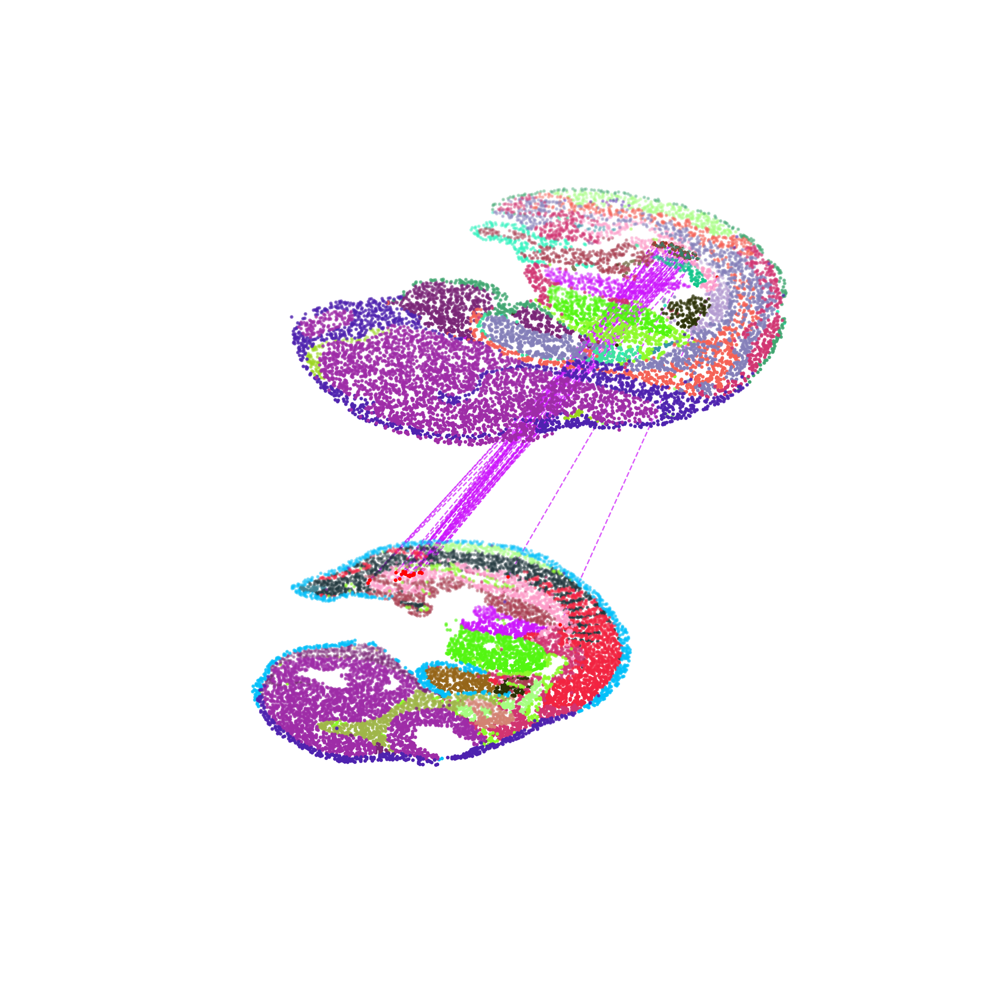

In [7]:
test = match_3D_celltype(adata1_harm_df, adata2_harm_df, matching_harm, meta='celltype', 
                         highlight_celltype=[['Urogenital ridge'], ['Kidney']],
                         subsample_size=7999, highlight_cell=['red'])
test.draw_3D(size=[10, 12], line_width=0.8, point_size=[1.2,1.2], hide_axis=True)

In [8]:
adata1.obsm['X_dpca'] = features[0].cpu().numpy()
adata2.obsm['X_dpca'] = features[1].cpu().numpy()

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
OMP: Info #277: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


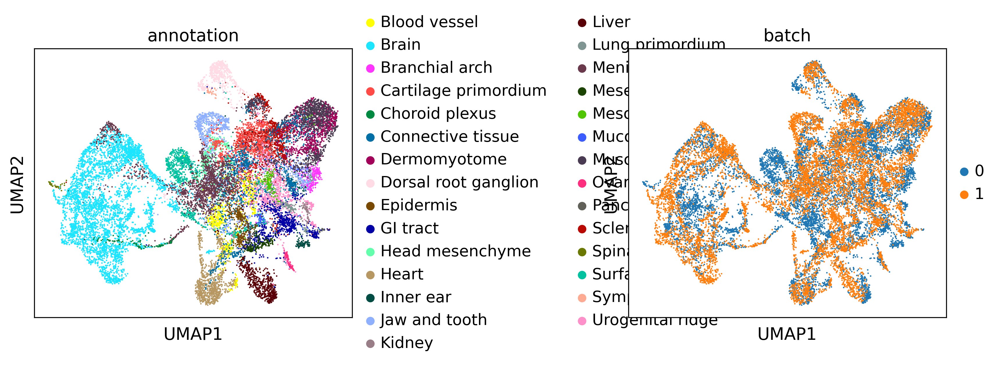

In [9]:
adata_all = adata1.concatenate(adata2)
sc.pp.neighbors(adata_all, metric="cosine", use_rep='X_dpca', n_pcs=50)
sc.tl.umap(adata_all)
sc.pl.umap(adata_all, color=["annotation", "batch"], wspace=0.7)

# run SLAT

In [72]:
embd0, embd1, time = run_SLAT(features, edges, LGCN_layer=5)

Choose GPU:1 as device
Running
---------- epochs: 1 ----------
---------- epochs: 2 ----------
---------- epochs: 3 ----------
---------- epochs: 4 ----------
---------- epochs: 5 ----------
---------- epochs: 6 ----------
Training model time: 1.21


In [75]:
best, index, distance = spatial_match([embd0, embd1], reorder=False, adatas=[adata1,adata2])

In [76]:
adata1_df = pd.DataFrame({'index':range(embd0.shape[0]),
                          'x': adata1.obsm['spatial'][:,0],
                          'y': adata1.obsm['spatial'][:,1],
                          'celltype':adata1.obs['annotation']})
adata2_df = pd.DataFrame({'index':range(embd1.shape[0]),
                          'x': adata2.obsm['spatial'][:,0],
                          'y': adata2.obsm['spatial'][:,1],
                          'celltype':adata2.obs['annotation']})
matching = np.array([range(index.shape[0]), best])
best_match = distance[:,0]
region_statistics(best_match,start=0.5,number_of_interval=10)

0.500~0.550        10          0.100%
0.550~0.600        35          0.350%
0.600~0.650       139          1.390%
0.650~0.700       461          4.610%
0.700~0.750      1127         11.269%
0.750~0.800      1737         17.368%
0.800~0.850      1897         18.968%
0.850~0.900      1922         19.218%
0.900~0.950      2033         20.328%
0.950~1.000       638          6.379%


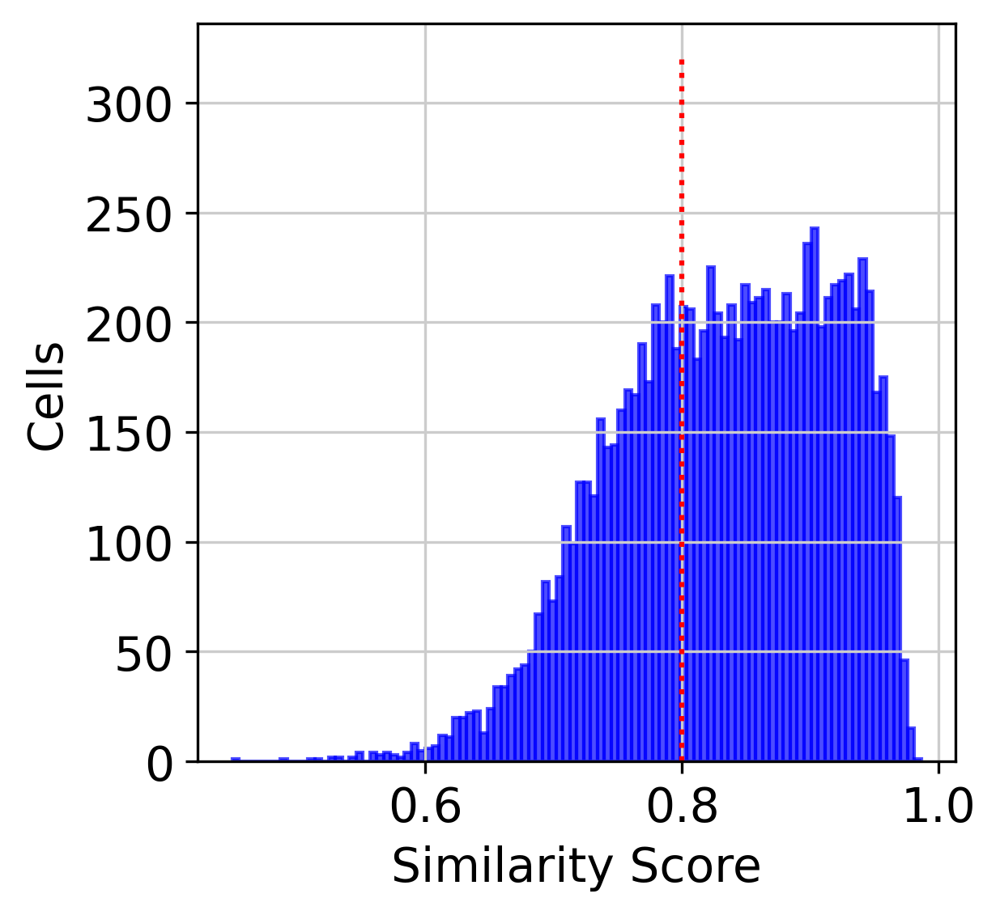

In [77]:
hist(best_match,cut=0.8,cut_height=320)

/rd2/user/xiacr/SLAT/scSLAT/viz/multi_dataset.py:204: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



dataset1: 18 cell types; dataset2: 22 cell types; 
                    Total :29 celltypes; Overlap: 11 cell types 
                    Not overlap :[['Sclerotome', 'Surface ectoderm', 'Branchial arch', 'Inner ear', 'Head mesenchyme', 'Spinal cord', 'Dermomyotome', 'Mesentery', 'Cartilage primordium', 'Muscle', 'Pancreas', 'Epidermis', 'Ovary', 'Sympathetic nerve', 'Choroid plexus', 'Kidney', 'Mucosal epithelium', 'Mesothelium']]
Subsample 300 cell pairs from 10001


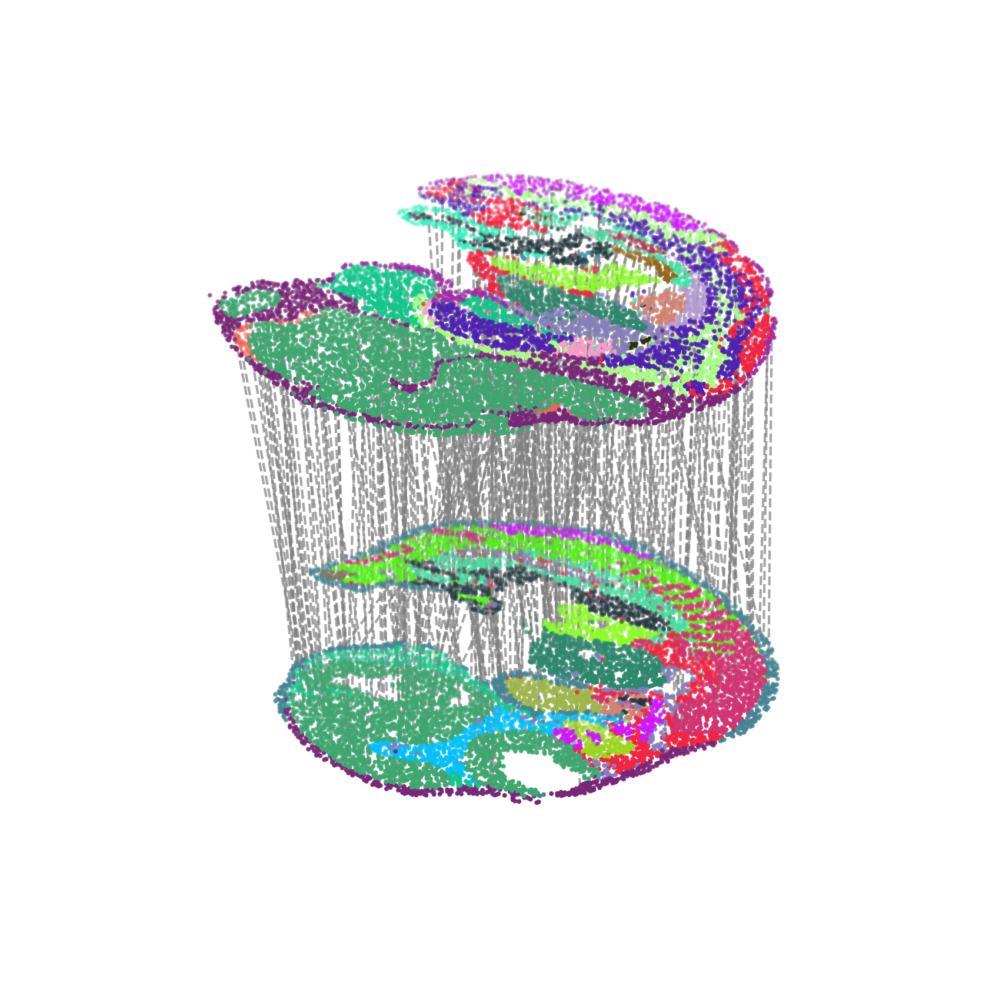

In [78]:
multi_align = match_3D_multi(adata1_df, adata2_df,matching,meta='celltype',
                             scale_coordinate=True,subsample_size=300,exchange_xy=False)

multi_align.draw_3D(size= [7, 8],line_width =1,point_size=[0.8,0.8], hide_axis=True,show_error=False)

In [79]:
adata2.obs['low_quality_index']= best_match 
adata2.obs['low_quality_index'] = adata2.obs['low_quality_index'].astype(float)

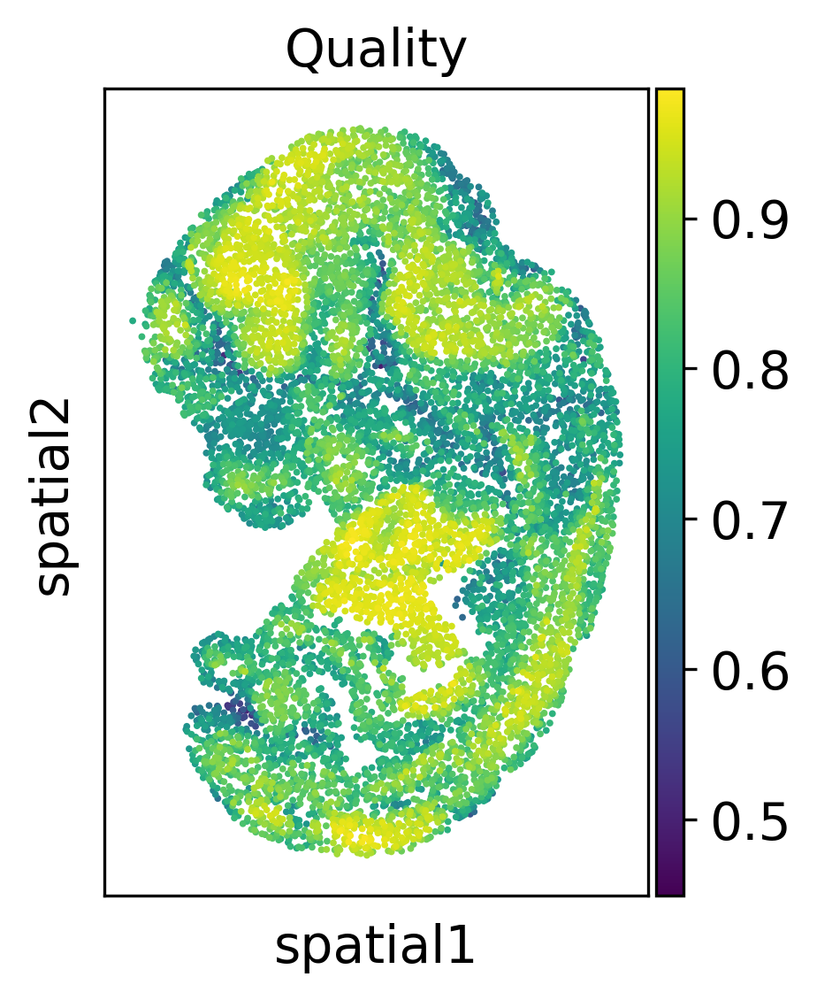

In [80]:
sc.pl.spatial(adata2, color='low_quality_index', spot_size=3, title='Quality')

In [81]:
adata2_df['target_celltype'] = adata1_df.iloc[matching[1,:],:]['celltype'].to_list()

In [82]:
matching_table = adata2_df.groupby(['celltype','target_celltype']).size().unstack(fill_value=0)

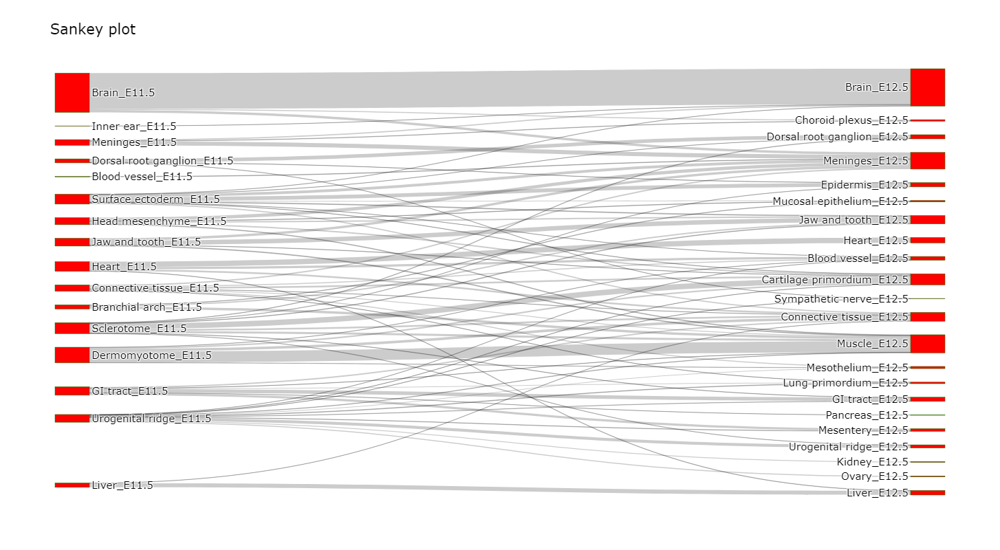

In [83]:
Sankey(matching_table, layout=[650,800], font_size=15)

In [84]:
np.savetxt('./SALT_alignment.csv', matching, delimiter=',')

# Kidney in development

In [94]:
kidney_prime = adata1[matching[1,adata2_df.loc[adata2_df.celltype=='Kidney','index'].values],:]
kidney = adata2[adata2.obs.annotation=='Kidney',:]
kidney_all = kidney_prime.concatenate(kidney)

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning:

X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [110]:
kidney_all.X = kidney_all.layers['counts'].todense()

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning:

Received a view of an AnnData. Making a copy.

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



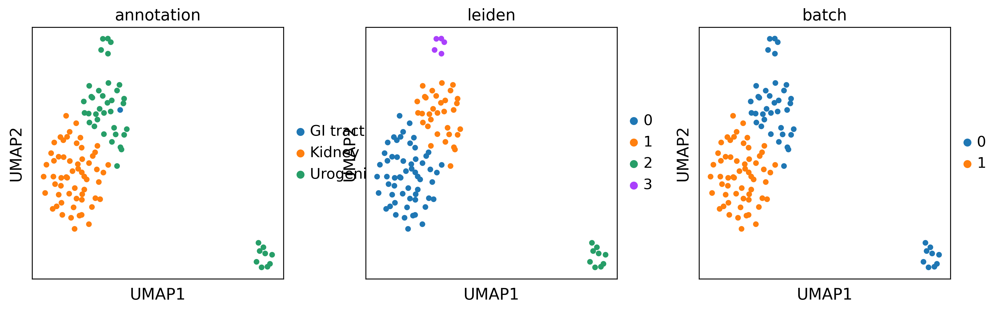

In [111]:
kidney_all = scanpy_workflow(kidney_all)
sc.pp.neighbors(kidney_all, metric="cosine")
sc.tl.umap(kidney_all)
sc.tl.leiden(kidney_all, resolution=1)
sc.pl.umap(kidney_all, color=['annotation','leiden','batch'],size=100)

In [109]:
kidney_all = kidney_all[kidney_all.obs.leiden.isin(['0','1','2','3']),]

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



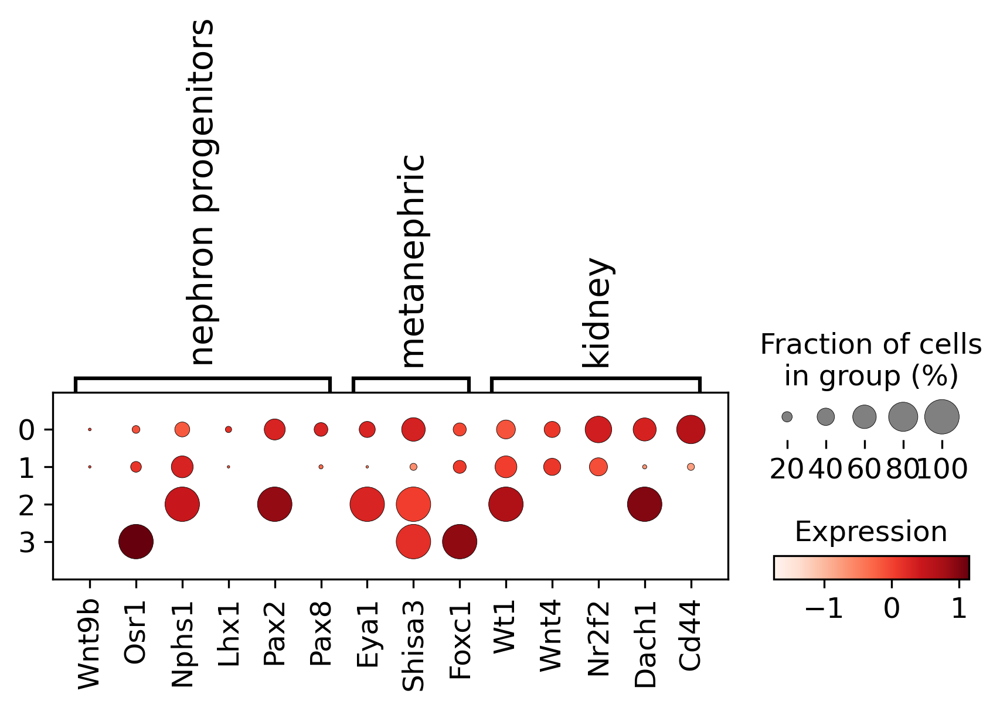

In [112]:
# Nphs1 https://www.nature.com/articles/s41467-021-22266-1
sc.pl.dotplot(kidney_all,{'nephron progenitors':['Wnt9b','Osr1','Nphs1','Lhx1','Pax2','Pax8'],
                         'metanephric':['Eya1','Shisa3','Foxc1'], 
                         'kidney':['Wt1','Wnt4','Nr2f2','Dach1','Cd44']} ,
              'leiden',dendrogram=False,colorbar_title='Expression')

In [65]:
kidney_all.obs['re_anno'] = 'Unknown'
kidney_all.obs.loc[kidney_all.obs.leiden.isin(['1']),'re_anno'] = 'Metanephron progenitors (E11.5)'
kidney_all.obs.loc[kidney_all.obs.leiden=='2','re_anno'] = 'Nephron progenitors (E11.5)'
kidney_all.obs.loc[kidney_all.obs.leiden=='3','re_anno'] = 'Nephron progenitors (E11.5)'
kidney_all.obs.loc[kidney_all.obs.leiden=='0','re_anno'] = 'Kidney (E12.5)'

/tmp/ipykernel_1629564/1029965559.py:1: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.

/rd2/user/xiacr/SLAT/conda/lib/python3.8/contextlib.py:120: FutureWarning:

X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



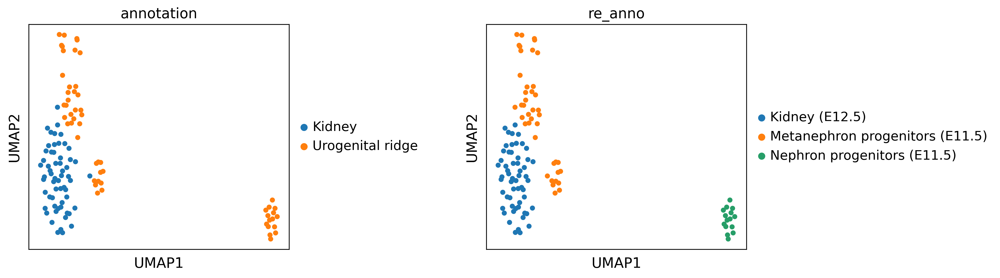

In [66]:
# kidney_all = kidney_all[kidney_all.obs.leiden!='3',:]
kidney_all.obs.leiden = list(kidney_all.obs.leiden)
sc.pl.umap(kidney_all, color=['annotation', 're_anno'],size=100, ncols=2,wspace=0.6)

categories: 0, 1, 2, etc.
var_group_labels: nephron progenitors, metanephic, kidney


/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



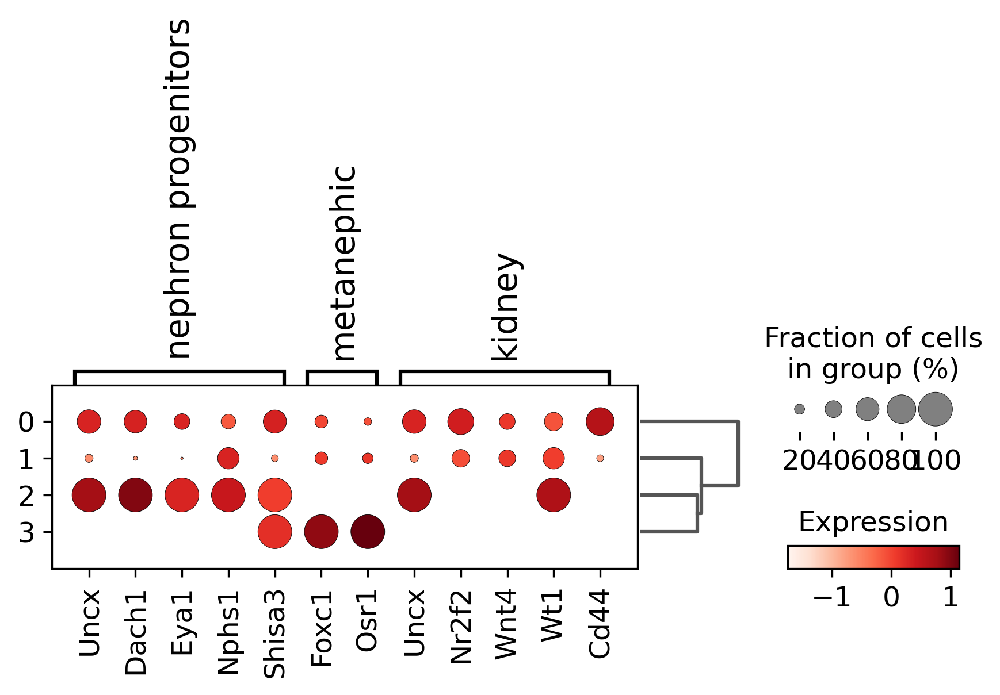

In [118]:
# https://www.nature.com/articles/s41467-021-22266-1
# https://genomemedicine.biomedcentral.com/articles/10.1186/s13073-019-0615-0/figures/1
sc.pl.dotplot(kidney_all, {'nephron progenitors':['Uncx','Dach1','Eya1','Nphs1','Shisa3'],
                           'metanephic':['Foxc1','Osr1'],
                         'kidney':['Uncx','Nr2f2','Wnt4','Wt1','Cd44']} ,
              'leiden',dendrogram=True,colorbar_title='Expression')

In [133]:
adata1.obs.drop('kidney_anno',axis=1,inplace=True)

In [134]:
kidney_1 = kidney_all.obs.loc[kidney_all.obs.batch=='0','re_anno']
kidney_1.index = [x.replace('-0','') for x in kidney_1.index]
kidney_1 = kidney_1[~kidney_1.index.duplicated(keep="first")]
kidney_1 = kidney_1.to_frame()
kidney_1.columns = ['kidney_anno']
kidney_1.kidney_anno = kidney_1.kidney_anno.to_list()

In [135]:
adata1.obs = adata1.obs.merge(kidney_1, how='left', left_index=True, right_index=True)

In [136]:
len(set(kidney_1.index) & set(adata1.obs_names))

20

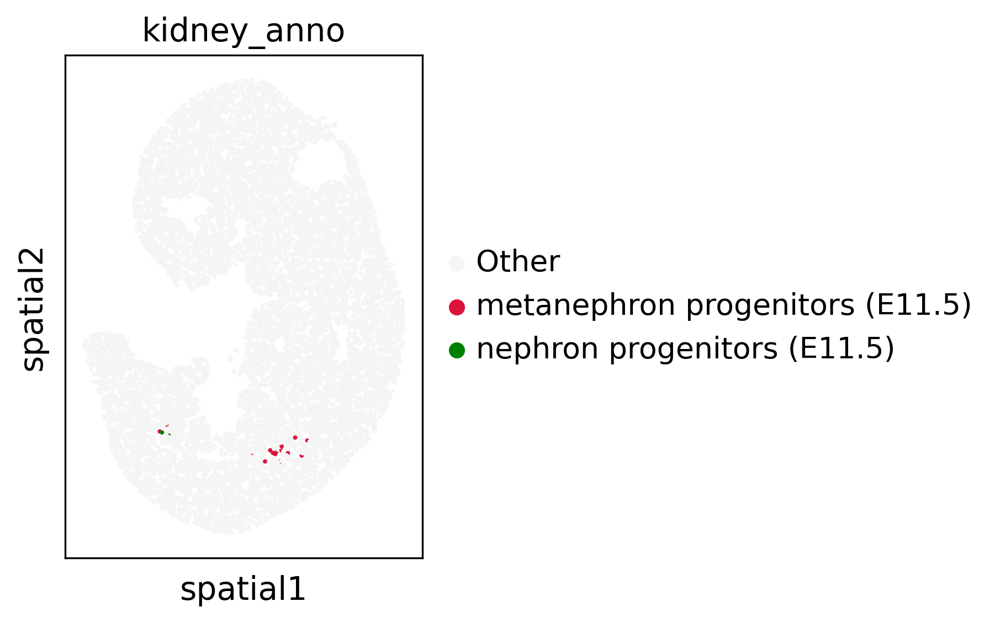

In [137]:
adata1.obs.kidney_anno = adata1.obs.kidney_anno.fillna('Other')
sc.pl.spatial(adata1, color=['kidney_anno'], spot_size=2.5, palette=['#F5F5F5','#DC143C','green','#FF8C00','#800000'])

/rd2/user/xiacr/SLAT/scSLAT/viz/multi_dataset.py:242: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



dataset1: 18 cell types; dataset2: 22 cell types; 
                    Total :29 celltypes; Overlap: 11 cell types 
                    Not overlap :[['Sclerotome', 'Inner ear', 'Head mesenchyme', 'Branchial arch', 'Dermomyotome', 'Surface ectoderm', 'Spinal cord', 'Mesentery', 'Sympathetic nerve', 'Kidney', 'Epidermis', 'Pancreas', 'Choroid plexus', 'Ovary', 'Cartilage primordium', 'Mucosal epithelium', 'Muscle', 'Mesothelium']]
Subsample 10000 cell pairs from 10001


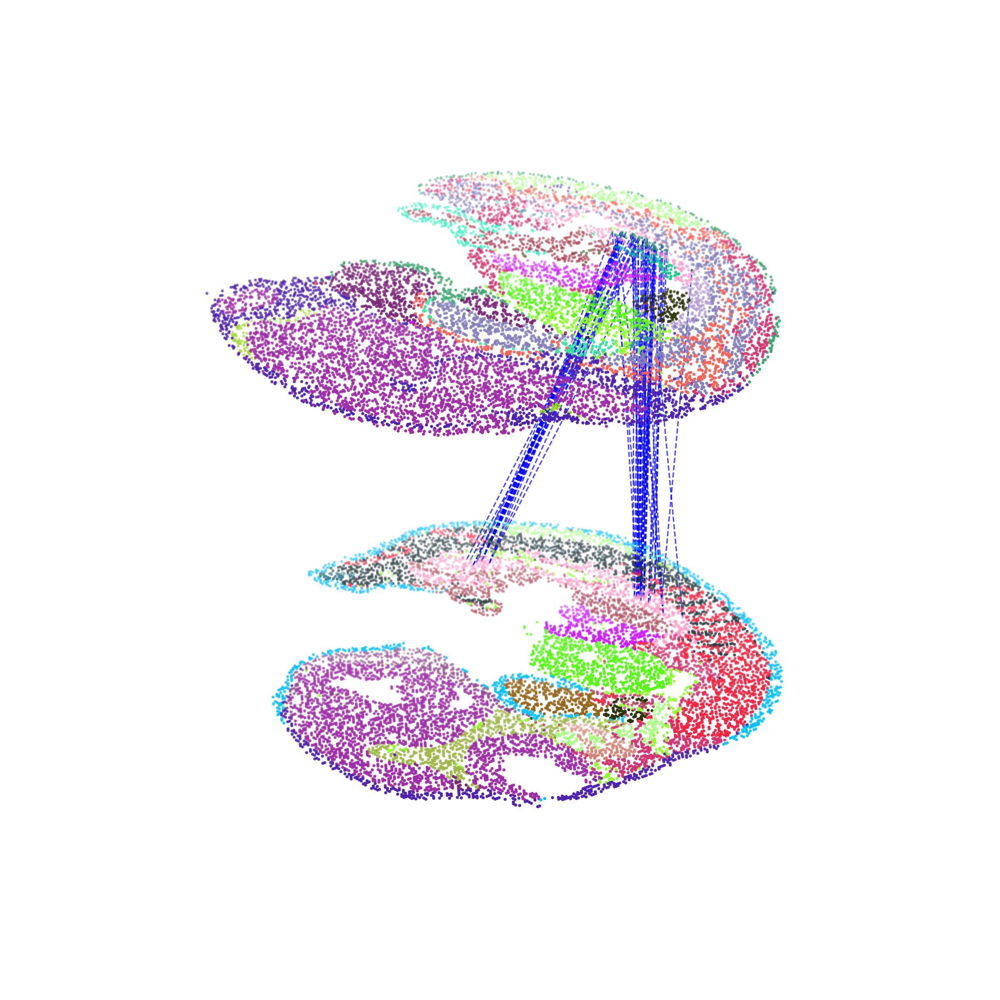

In [30]:
test = match_3D_celltype(adata1_df, adata2_df, matching, meta='celltype', highlight_celltype = [['Urogenital ridge'],['Kidney']],subsample_size=10000, highlight_line = ['blue'],scale_coordinate = True )
test.draw_3D(size= [10, 12],line_width =0.8,point_size=[0.6,0.6], hide_axis=True)

# Ovary in development

/rd2/user/xiacr/SLAT/scSLAT/viz/multi_dataset.py:242: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



dataset1: 18 cell types; dataset2: 22 cell types; 
                    Total :29 celltypes; Overlap: 11 cell types 
                    Not overlap :[['Sclerotome', 'Inner ear', 'Head mesenchyme', 'Branchial arch', 'Dermomyotome', 'Surface ectoderm', 'Spinal cord', 'Mesentery', 'Sympathetic nerve', 'Kidney', 'Epidermis', 'Pancreas', 'Choroid plexus', 'Ovary', 'Cartilage primordium', 'Mucosal epithelium', 'Muscle', 'Mesothelium']]
Subsample 10000 cell pairs from 10001


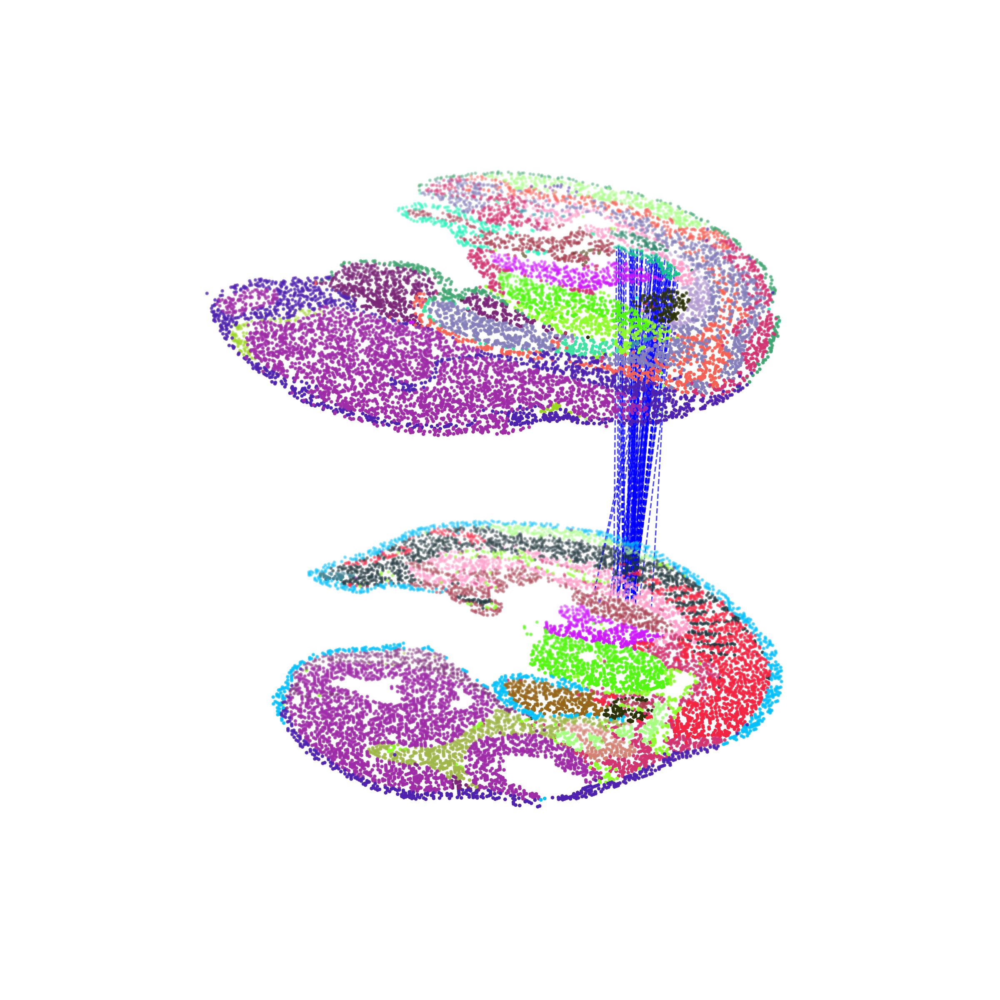

In [31]:
test = match_3D_celltype(adata1_df, adata2_df, matching, meta='celltype', highlight_celltype = [['Urogenital ridge'],['Ovary']],subsample_size=10000, highlight_line = ['blue'],scale_coordinate = True)
test.draw_3D(size= [10, 12],line_width =0.8,point_size=[1.2,1.2], hide_axis=True)

# Highlight lung

In [32]:
adata1.obs['is_lung'] = 'Other'
adata2.obs['is_lung'] = 'Other'
adata1.obs.loc[adata1.obs.annotation=='Heart','is_lung'] = 'Heart'
adata2.obs.loc[adata2.obs.annotation=='Heart','is_lung'] = 'Heart'
adata1.obs.loc[adata1.obs.annotation=='Lung primordium','is_lung'] = 'Lung primordium'
adata2.obs.loc[adata2.obs.annotation=='Lung primordium','is_lung'] = 'Lung primordium'


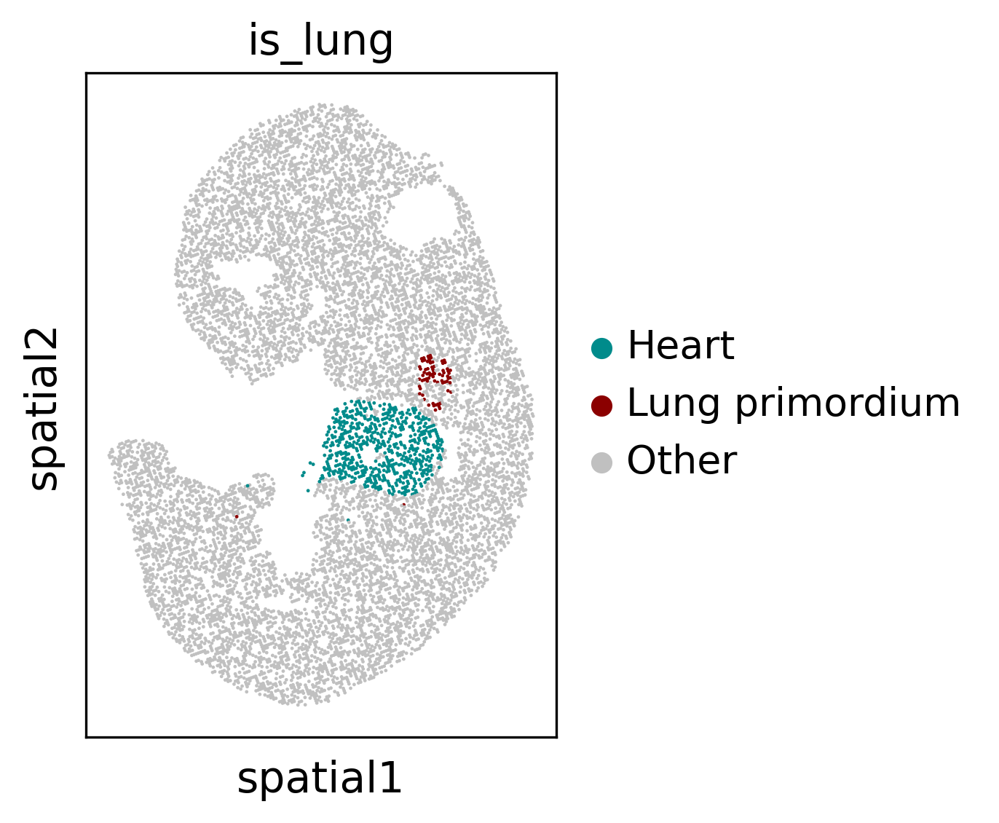

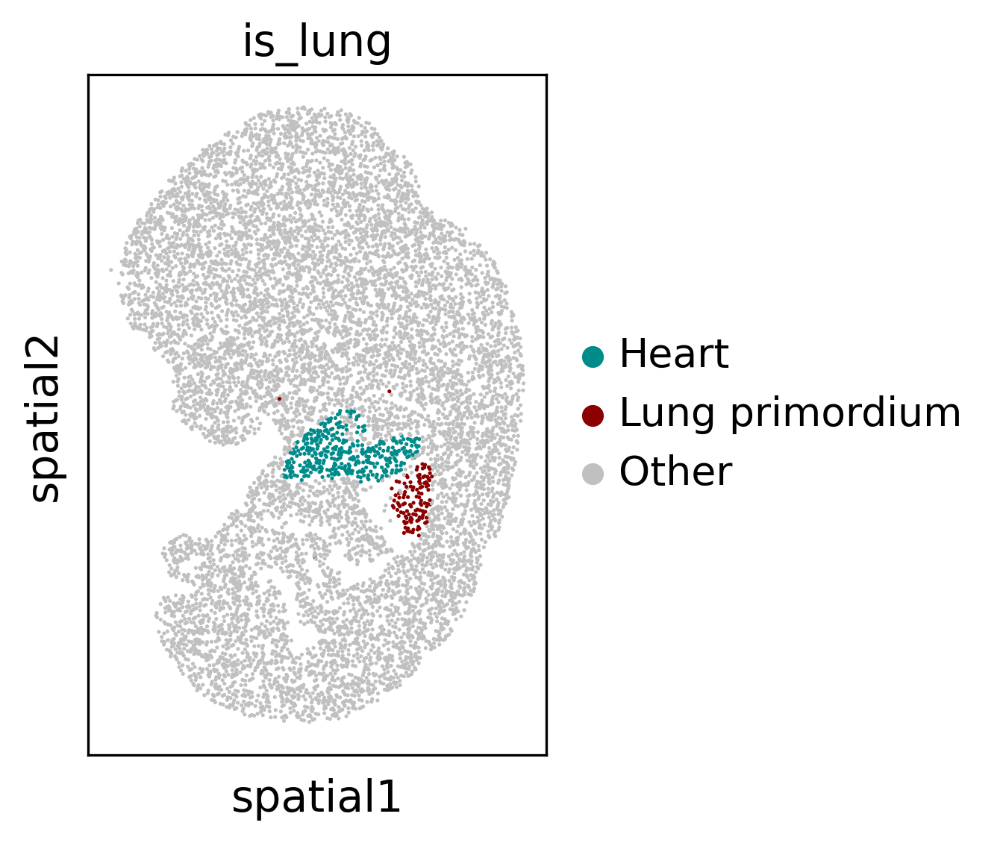

In [39]:
sc.pl.spatial(adata1, color=['is_lung'], spot_size=1.5, palette=['#008B8B','#8B0000','#C0C0C0'])
sc.pl.spatial(adata2, color=['is_lung'], spot_size=2, palette =['#008B8B','#8B0000','#C0C0C0'])

# Save data

In [ ]:
adata1.write_h5ad('./adata1_processed.h5ad')
adata2.write_h5ad('./adata2_processed.h5ad')